###  Importing the dependencies

In [1]:
%%time
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import pandas as pd
import numpy as np
import sklearn
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
%matplotlib inline

Wall time: 1.8 s


### Reading csv 

In [2]:
%%time
stats = pd.read_csv('wdbc.csv',header=None)

Wall time: 57.6 ms


### Simple EDA 

#### display data

In [3]:
stats.shape

(569, 32)

In [4]:
stats.tail(2)

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.3514,0.152,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.265,0.4087,0.12400
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.0000,0.000,...,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.000,0.2871,0.07039


### Distribution and pairplots

In [5]:
columns = stats.columns
plt.figure(figsize=(10,10))
sns.pairplot(stats[columns[2:]], size=5, aspect=0.6)

<Figure size 720x720 with 0 Axes>

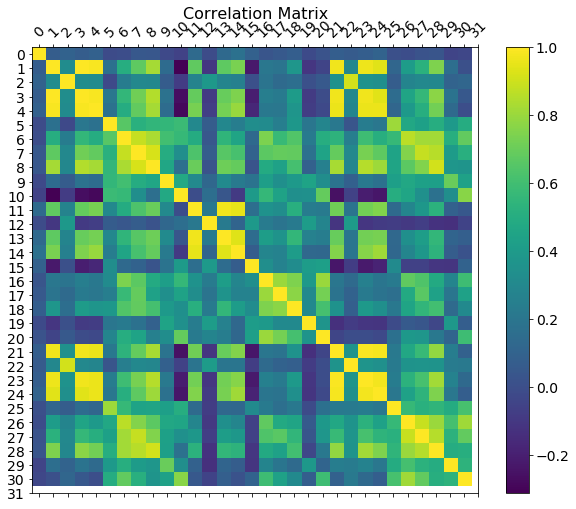

In [6]:
f = plt.figure(figsize=(10, 8))
plt.matshow(stats.corr(), fignum=f.number)
plt.xticks(range(stats.shape[1]), stats.columns, fontsize=14, rotation=45)
plt.yticks(range(stats.shape[1]), stats.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

#### check null values

In [7]:
is_null = stats.isnull().sum().sort_index()/len(stats)
is_null[:5]

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
dtype: float64

#### checking dtypes 

In [8]:
stats.dtypes.value_counts()

float64    30
int64       1
object      1
dtype: int64

#### checking number of columns and rows 

In [9]:
print(len(stats.columns))
print(len(stats.index))

32
569


In [10]:
data_stats = stats.describe(include="all")
x = data_stats.pop(0)
data_stats = data_stats.T
data_stats.iloc[:,4:]

,mean,std,min,25%,50%,75%,max
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,14.1273,3.52405,6.981,11.7,13.37,15.78,28.11
3,19.2896,4.30104,9.71,16.17,18.84,21.8,39.28
4,91.969,24.299,43.79,75.17,86.24,104.1,188.5
5,654.889,351.914,143.5,420.3,551.1,782.7,2501
6,0.0963603,0.0140641,0.05263,0.08637,0.09587,0.1053,0.1634
7,0.104341,0.0528128,0.01938,0.06492,0.09263,0.1304,0.3454
8,0.0887993,0.0797198,0,0.02956,0.06154,0.1307,0.4268
9,0.0489191,0.0388028,0,0.02031,0.0335,0.074,0.2012
10,0.181162,0.0274143,0.106,0.1619,0.1792,0.1957,0.304


In [11]:
#Dropping the id column

stats.drop(stats.columns[0], axis=1, inplace=True)

In [12]:
stats.head(2)

,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
0,M,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902


In [13]:
#Converting the categorical data to binary representation

stats[stats.columns[0]] = stats[stats.columns[0]] == "M"

In [14]:
stats[stats.columns[0]] = stats[stats.columns[0]].apply(int)

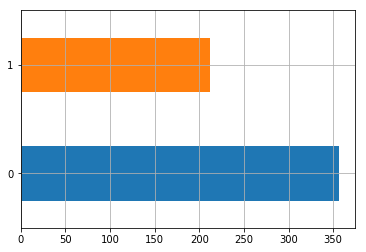

In [15]:
stats[stats.columns[0]].value_counts().plot(kind="barh",figsize=(6,4))
plt.grid(True)

### Train, Validation, Test Split

In [16]:
#Spliting the train(80 %) ,test(20%) and validation(10% of test data) data

train = stats.sample(frac=0.8,random_state=200)
test = stats.drop(train.index)
val = test.sample(frac=0.5,random_state=200)
test = test.drop(val.index)

In [17]:
train_X = train[train.columns[1:31]]
train_Y= train[train.columns[0]]
train_Y = train_Y.values.reshape(train_Y.shape[0],1)

In [18]:
print(train_X.shape)
print(train_Y.shape)

(455, 30)
(455, 1)


In [19]:
test_X = test[test.columns[1:31]]
test_Y= test[test.columns[0]]
test_Y = test_Y.values.reshape(test_Y.shape[0],1)

In [20]:
print(test_X.shape)
print(test_Y.shape)

(57, 30)
(57, 1)


In [21]:
val_X = val[val.columns[1:31]]
val_Y = val[val.columns[0]]
val_Y = val_Y.values.reshape(val_Y.shape[0],1)

In [22]:
print(val_X.shape)
print(val_Y.shape)

(57, 30)
(57, 1)


### Normalize 

In [23]:
#Normalization of dataset

def Normalize(d):
    mean = d.mean()
    standard_error =d.std()
    return ((d - mean)/standard_error)

In [24]:
train_X = Normalize(train_X)
test_X = Normalize(test_X)
val_X = Normalize(val_X)

### Training 

In [25]:
#Random Initialization of weights,bias

def random(v):
    w = np.zeros((v,1))
    b = 0
    return w,b

#Hypothesis Function

def linear(X,w,b):
    return np.dot(X,w) + b

# Sigmoidal Function

def sigmoid(z):
    return 1/(1+np.exp(-z))

#Cost Function

def loss_func(Y, a, m):
    return (np.sum(Y*np.log(a) - (1-Y)*np.log(1-a))/m)

### Grid Search 

In [26]:

train_cost = []
train_acc = []
valid_acc = []
valid_cost = []

m = len(train_X)
epochs = 1000
train_models = {}
valid_models = {}

#hyperparameters
learning_rate = [0.1,0.01,0.001,0.0001]

for i in range(len(learning_rate)):
    w,b = random(train_X.shape[1])
    train_cost = [] 
    train_acc = []
    valid_acc = []
    valid_cost = []
    for epoch in range(epochs):
        z = linear(train_X,w,b)
        a = sigmoid(z)
        loss=loss_func(train_Y,a,m)
        dz = a-train_Y
        dw = np.dot(np.transpose(train_X),dz)/m
        db = np.sum(dz)/m
        w = w - learning_rate[i] * dw
        b = b - learning_rate[i] * db
        if(epoch % 100 == 0):
            train_cost.append(loss)
            train_acc.append(np.mean(np.round(a)==train_Y))
            val_temp = sigmoid(np.dot(val_X, w) + b)
            val_prediction = np.array([1 if x >= 0.5 else 0 for x in val_temp])
            val_prediction = val_prediction.reshape((val_prediction.shape[0],1))
            valid_acc.append((100 - np.mean(np.abs(val_prediction - val_Y))*100))
            valid_cost.append(loss_func(val_Y,val_temp,m))
        if (epoch==epochs-1):
            train_models["alpha: " + str(learning_rate[i])] = (train_acc, train_cost)
            valid_models["alpha: " + str(learning_rate[i])] = (valid_acc, valid_cost)
weights = w
bias = b

### Finding the best model 

In [27]:
maximum_acc = 0
best_flag = None
best_model = None
for x, (key, value) in enumerate(train_models.items()):
    acc, loss = value
    if(maximum_acc<acc[-1]):
        best_flag = x
        maximum_acc = acc[-1]
        best_model=key

In [28]:
print("The best hyperparameters are: {}".format(best_model))
print("The train accuracy by the model is: {:.2f}%".format(maximum_acc*100))

The best hyperparameters are: alpha: 0.1
The train accuracy by the model is: 99.12%


### Plotting performance of all models

#### Training loss 

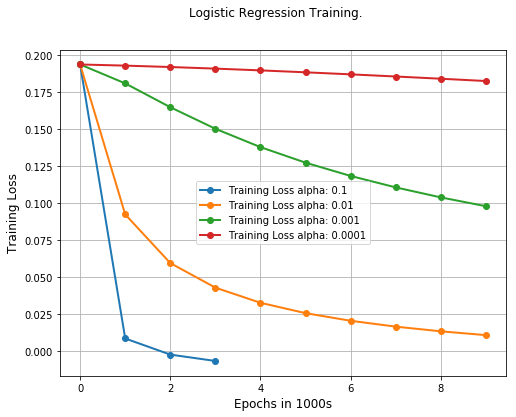

In [29]:
train_keys = list(train_models.keys())
plt.figure(figsize=(8,6))
for idx in range(len(train_keys)):
    cost = np.squeeze(train_models[train_keys[idx]][1])
    plt.plot(cost,marker='o',label="Training Loss " + str(train_keys[idx]),lw=2)
plt.xlabel("Epochs in 1000s",fontsize=12)
plt.ylabel('Training Loss',fontsize=12)
plt.grid(True)
plt.suptitle("Logistic Regression Training.")
plt.legend()
plt.show()

#### Validation loss 

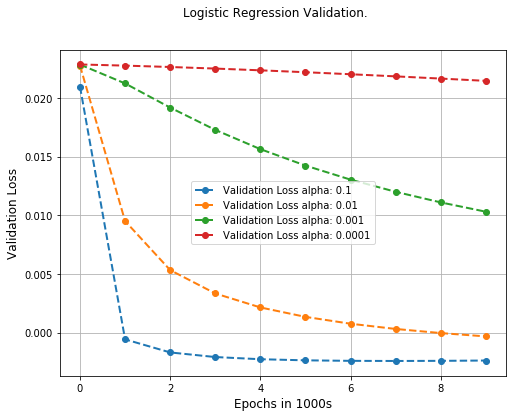

In [30]:
valid_keys = list(valid_models.keys())
plt.figure(figsize=(8,6))
for idx in range(len(train_keys)):
    cost = np.squeeze(valid_models[valid_keys[idx]][1])
    plt.plot(cost,"--",marker='o',label="Validation Loss " + str(valid_keys[idx]),lw=2)
plt.xlabel("Epochs in 1000s",fontsize=12)
plt.ylabel('Validation Loss',fontsize=12)
plt.grid(True)
plt.suptitle("Logistic Regression Validation.")
plt.legend()
plt.show()

#### Training accuracy 

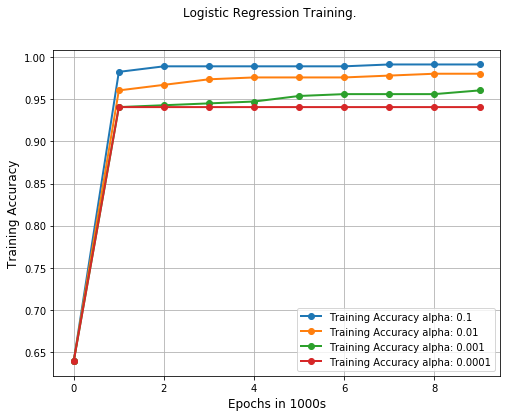

In [31]:
train_keys = list(train_models.keys())
plt.figure(figsize=(8,6))
for idx in range(len(train_keys)):
    acc = np.squeeze(train_models[train_keys[idx]][0])
    plt.plot(acc,marker='o',label="Training Accuracy " + str(train_keys[idx]),lw=2)
plt.xlabel("Epochs in 1000s",fontsize=12)
plt.ylabel('Training Accuracy',fontsize=12)
plt.grid(True)
plt.legend()
plt.suptitle("Logistic Regression Training.")
plt.show()

#### Validation Accuracy 

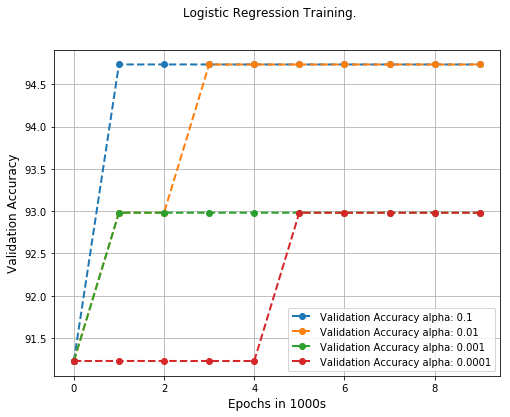

In [32]:
valid_keys = list(valid_models.keys())
plt.figure(figsize=(8,6))
for idx in range(len(valid_keys)):
    acc = np.squeeze(valid_models[valid_keys[idx]][0])
    plt.plot(acc,"--",marker='o',label="Validation Accuracy " + str(valid_keys[idx]),lw=2)
plt.xlabel("Epochs in 1000s",fontsize=12)
plt.ylabel('Validation Accuracy',fontsize=12)
plt.grid(True)
plt.legend()
plt.suptitle("Logistic Regression Training.")
plt.show()

### Plotting perfromance of Best Model

#### Training and Validation Accuracy 

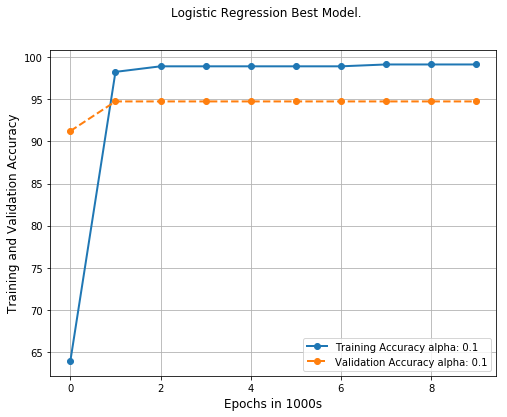

In [33]:
valid_keys = list(valid_models.keys())
train_keys = list(train_models.keys())
plt.figure(figsize=(8,6))

acc = np.squeeze(train_models[train_keys[best_flag]][0]) * 100
plt.plot(acc,marker='o',label="Training Accuracy " + str(train_keys[best_flag]),lw=2)
acc = np.squeeze(valid_models[valid_keys[best_flag]][0])
plt.plot(acc,"--",marker='o',label="Validation Accuracy " + str(valid_keys[best_flag]),lw=2)

plt.xlabel("Epochs in 1000s",fontsize=12)
plt.ylabel('Training and Validation Accuracy',fontsize=12)
plt.grid(True)
plt.legend()
plt.suptitle("Logistic Regression Best Model.")
plt.show()

#### Training and Validation Loss 

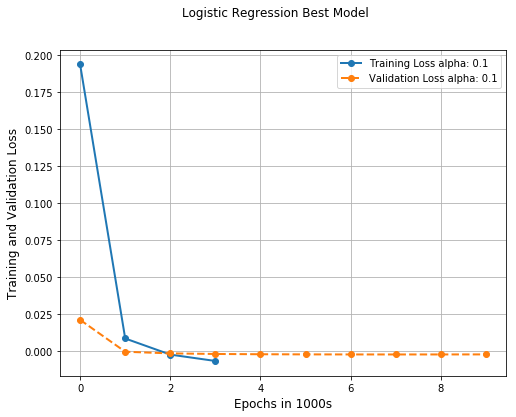

In [34]:
train_keys = list(train_models.keys())
valid_keys = list(valid_models.keys())
plt.figure(figsize=(8,6))

cost = np.squeeze(train_models[train_keys[best_flag]][1])
plt.plot(cost,marker='o',label="Training Loss " + str(train_keys[best_flag]),lw=2)
cost = np.squeeze(valid_models[valid_keys[best_flag]][1])
plt.plot(cost,'--',marker='o',label="Validation Loss " + str(valid_keys[best_flag]),lw=2)

plt.xlabel("Epochs in 1000s",fontsize=12)
plt.ylabel('Training and Validation Loss',fontsize=12)
plt.grid(True)
plt.suptitle("Logistic Regression Best Model")
plt.legend()
plt.show()

#### Retraining the model with best hyperparameters

In [35]:
w,b = random(train_X.shape[1])
cost = []
acc = []
m = len(train_X)
epochs = 1000
    
for epoch in range(epochs):
    z = linear(train_X,w,b)
    a = sigmoid(z)
    loss=loss_func(train_Y,a,m)
    dz = a-train_Y
    dw = np.dot(np.transpose(train_X),dz)/m
    db = np.sum(dz)/m
    w = w - 0.1 * dw
    b = b - 0.1 * db
    if(epoch % 50 == 0):
        train_cost.append(loss)
        train_acc.append(np.mean(np.round(a)==train_Y))
weights = w
bias = b

In [36]:
# Accuracy for training set:
temp = sigmoid(np.dot(train_X, weights) + bias)
train_prediction = np.array([1 if x >= 0.5 else 0 for x in temp])
train_prediction = train_prediction.reshape((train_prediction.shape[0],1))

# Accuracy for test set:
temp = sigmoid(np.dot(test_X, weights) + bias)
test_prediction = np.array([1 if x > 0.5 else 0 for x in temp])
test_prediction = test_prediction.reshape((test_prediction.shape[0],1))

print("Training set accuracy = {:.2f}%".format((100 - np.mean(np.abs(train_prediction - train_Y))*100)))
print("Test set accuracy = {:.2f}%".format((100 - np.mean(np.abs(test_prediction - test_Y))*100)))

Training set accuracy = 99.12%
Test set accuracy = 94.74%


In [37]:
#Confusion Matrix

mat = confusion_matrix(test_Y, test_prediction)

In [38]:
# Printing the Confusion Matrix
print(mat)

[[30  0]
 [ 3 24]]


In [39]:
# Function to calculate Accuracy, Precison and Recall
def cm(cf):
    
    tp = cf[0][0]
    fp = cf[0][1]

    fn = cf[1][0]
    tn = cf[1][1]

    print("TP: %d\nTN: %d" % (tp, tn))
    print("FP: %d\nFN: %d" % (fp, fn))
    rec = tp*100/(tp+fn)
    print ("Sensitivity/Recall (TPR): %s" % (rec))
    print ("Specificity (TNR/SPC): %s" % (tn*100/(fp+tn)))
    print ("FPR: %s" % (100-(tn*100/(fp+tn))))
    print ("FNR: %s" % (100-rec))

    prec = tp*100/(tp+fp)
    print("\nPrecision: %s" % (prec))
    print("F1-score: %s" % ((2*prec*rec)/(prec+rec)))
    print("\nAccuracy: %s" % ((tp+tn)*100/(tp+tn+fp+fn)))
    
    return ((tp+tn)*100/(tp+tn+fp+fn))

In [40]:
#The final results:
print(cm(mat))

TP: 30
TN: 24
FP: 0
FN: 3
Sensitivity/Recall (TPR): 90.9090909090909
Specificity (TNR/SPC): 100.0
FPR: 0.0
FNR: 9.090909090909093

Precision: 100.0
F1-score: 95.23809523809523

Accuracy: 94.73684210526316
94.73684210526316
